In [15]:
from astropy.table import Table
from dendrocat import RadioSource
from astropy.io import fits
from spectral_cube import SpectralCube
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import numpy as np
import sys
import importlib
from astropy.wcs import WCS
from scipy import interpolate
import pandas as pd
import sympy as syp
from astropy import units as u
import radio_beam
from astropy.table import Table
from radio_beam import Beam
from astropy import coordinates
from astropy import wcs
from astropy.nddata.utils import Cutout2D
from astropy.io import ascii
from matplotlib.patches import Rectangle, Ellipse, Circle
import Paths.Paths as paths

Path = paths.filepaths()

from matplotlib import colors
import astropy.units as u
import matplotlib as mpl
import seaborn as sns

plt.rcParams['axes.labelsize']=60
plt.rcParams['xtick.labelsize']=50
plt.rcParams['ytick.labelsize']=50
plt.rcParams['axes.titlesize']=60
mpl.rcParams['axes.linewidth'] = 10
mpl.rcParams['xtick.major.size'] = 10
mpl.rcParams['xtick.major.width'] = 4
mpl.rcParams['xtick.minor.size'] = 5
mpl.rcParams['xtick.minor.width'] = 2
mpl.rcParams['ytick.major.size'] = 10
mpl.rcParams['ytick.major.width'] = 4
mpl.rcParams['ytick.minor.size'] = 5
mpl.rcParams['ytick.minor.width'] = 2
class core_catdata():
    def __init__(self,catfile, almaimf_beam,  start_coreno, hrfits=None,band='B3', recommend_criteria = 'b6', include_ff='all' ):
        catdata_w51e = ascii.read(catfile,data_start=0,format='commented_header', header_start=120,  comment="!")
        geo_avg_beam = np.sqrt(almaimf_beam.major.to(u.arcsec).value*almaimf_beam.minor.to(u.arcsec).value)
        corr_factor = catdata_w51e['AFWHM02'] * catdata_w51e['BFWHM02'] / catdata_w51e['AFWHM03'] / catdata_w51e['BFWHM03']
        numcore_tot = len(catdata_w51e['AFWHM02'])
        if include_ff=='all':
            coreno_merged = start_coreno[0] + start_coreno[1]
            print('coreno_merged',coreno_merged)
            coreno_merged.sort()
            coreno_start = coreno_merged
            print('coreno_start',coreno_start)
        elif include_ff=='ffonly':
            coreno_start = start_coreno[1]
        elif include_ff=='no':
            coreno_start = start_coreno[0]
        coreidx_start = [i for i in range(numcore_tot) if catdata_w51e['NO'][i] in coreno_start]
        if recommend_criteria == 'b6b3':
            coreidx = [idx for idx in coreidx_start if all([np.abs(catdata_w51e['GOODM02'][idx])>1,  
                       np.abs(catdata_w51e['SIGNM02'][idx])>1,  
                       catdata_w51e['FXP_BST02'][idx]/catdata_w51e['FXP_ERR02'][idx]>2, 
                       catdata_w51e['FXT_BST02'][idx]/catdata_w51e['FXT_ERR02'][idx]>2, 
                       catdata_w51e['AFWHM02'][idx]/catdata_w51e['BFWHM02'][idx]<2 ,
                        catdata_w51e['FOOA02'][idx]/catdata_w51e['AFWHM02'][idx]>1.15 ,
                        np.sqrt(catdata_w51e['AFWHM03'][idx]*catdata_w51e['BFWHM03'][idx]) <4 * geo_avg_beam  ,
                        catdata_w51e['AFWHM03'][idx]/catdata_w51e['BFWHM03'][idx]<=2 ,
                        np.abs(catdata_w51e['SIGNM03'][idx])>1 ,
                        catdata_w51e['FXP_BST03'][idx]/catdata_w51e['FXP_ERR03'][idx]>1,  
                        catdata_w51e['FXT_BST03'][idx]/catdata_w51e['FXT_ERR03'][idx]>1])]
        elif recommend_criteria == 'b6':
            coreidx = coreidx_start                  
       
        
        if hrfits is not None:
            yso_image = fits.open(hrfits)[0].data[0][0]
            hrhdr = fits.open(hrfits)[0].header
            inside_idx = exist_inside_FOV(catdata_w51e['WCS_ACOOR'], catdata_w51e['WCS_DCOOR'], yso_image, hrhdr)
    
            rec_ind = np.intersect1d(coreidx, inside_idx)
        else:
            rec_ind = coreidx
        print('total core number = ', len(catdata_w51e['WCS_ACOOR']))
        print(hrfits)
        print('robust %s measurement before applying FoV criteria = '%band, len(coreidx))
        print('robust %s measurement after applying FoV criteria = '%band, len(rec_ind))
       
        self.sky_ra = catdata_w51e['WCS_ACOOR'][rec_ind]
        self.sky_dec = catdata_w51e['WCS_DCOOR'][rec_ind]
        self.pix_x = catdata_w51e['XCO_P'][rec_ind]
        self.pix_y = catdata_w51e['YCO_P'][rec_ind]
        
        if band=='B3':
            bandind = 3
        else:
            bandind = 2

        self.afwhm = catdata_w51e['AFWHM0%d'%bandind][rec_ind] #arcsec
        self.bfwhm = catdata_w51e['BFWHM0%d'%bandind][rec_ind]

        self.asize = catdata_w51e['ASIZE0%d'%bandind][rec_ind]
        self.bsize = catdata_w51e['BSIZE0%d'%bandind][rec_ind]

        self.theta = catdata_w51e['THETA0%d'%bandind][rec_ind]
        
        self.flux = catdata_w51e['FXT_BST0%d'%bandind][rec_ind]
        self.fluxerr = catdata_w51e['FXT_ERR0%d'%bandind][rec_ind]
        self.flux_g = catdata_w51e['FXT_ALT0%d'%bandind][rec_ind]

        self.fooa = catdata_w51e['FOOA0%d'%bandind][rec_ind]
        self.foob = catdata_w51e['FOOB0%d'%bandind][rec_ind]
        
        self.int_peak = catdata_w51e['FXP_BST0%d'%bandind][rec_ind]
        self.interr_peak = catdata_w51e['FXP_ERR0%d'%bandind][rec_ind]
        
        self.size = (catdata_w51e['AFWHM0%d'%bandind][rec_ind]*catdata_w51e['BFWHM0%d'%bandind][rec_ind]**2)**(1/3) #arcsec


        self.no = catdata_w51e['NO'][rec_ind]

        
        
        rescaled_3mmflux = catdata_w51e['FXT_BST03'][rec_ind] * catdata_w51e['AFWHM02'][rec_ind] * catdata_w51e['BFWHM02'][rec_ind] / catdata_w51e['AFWHM03'][rec_ind]/catdata_w51e['BFWHM03'][rec_ind]
        gamma = np.log10(catdata_w51e['FXT_BST02'][rec_ind] / rescaled_3mmflux)/np.log10(228.918/101.426)
        self.woffind = np.where(gamma>2)[0]
        self.wffind = np.where(gamma<2)[0]
        self.rec_ind = rec_ind

    def get_temperature(self,tempfile,temp100ind = [], temp300ind =[]):
        #temp100ind = hot cores with 100K
        #temp300ind = hot cores with 300K

        tab = ascii.read(tempfile, data_start=4)
        id = tab['col1']
        ra = tab['col2']
        dec = tab['col3']
        temp = tab['col4']

        """
        for i in range(len(self.sky_ra)):
            dist = np.sqrt((self.sky_ra[i]-ra)**2+(self.sky_dec[i]-dec)**2) #deg
            mindist = np.min(dist)
            if mindist<threshold:
                index = np.argmin(dist)
                temparr.append(temp[index])
            else:
                temparr.append(np.nan)
        """
        temparr = np.array([temp[np.where(id==no)[0]][0] for no in self.no])
        for i in range(len(temp100ind)):
            if temp100ind[i] in self.no:
                idx100 = np.where(self.no==temp100ind[i])[0]
                print(idx100)
                temparr[idx100] = 100
                print('#%d core temp -->100K'%temp100ind[i])
        for i in range(len(temp300ind)):
            if temp300ind[i] in self.no:
                idx300 = np.where(self.no==temp300ind[i])[0]
                temparr[idx300] = 300
                print('#%d core temp -->300K'%temp300ind[i])
        self.temp = np.array(temparr)*u.K
        
        return self.temp
    
    def get_tau(self, freq, omega):
        bb = models.BlackBody(temperature=self.temp)
    
        peak_int = (self.int_peak * u.Jy/u.beam).to(u.Jy/u.sr, equivalencies=u.beam_angular_area(omega))

        return -np.log(1 - (peak_int/ bb(freq).to(u.Jy/u.sr)).to(u.cm/u.cm).value)
    
    def get_coremass(self, freq, kappa, dist,omega):
            
        print('self.temp',self.temp)
        bb = models.BlackBody(temperature=self.temp)
        peak_int = (self.int_peak * u.Jy/u.beam).to(u.Jy/ u.sr, equivalencies=u.beam_angular_area(omega))
        print('peak_int',peak_int)
        print('self.flux',self.flux)
        print('kappa',kappa)
        print(bb(freq).to(u.Jy/u.sr))
        mass = - 1 / kappa * dist**2 * self.flux * u.Jy/ u.sr / peak_int * np.log(1 - (peak_int/ bb(freq).to(u.Jy/u.sr)).to(u.cm/u.cm).value)
        print((peak_int/ bb(freq).to(u.Jy/u.sr)).to(u.cm/u.cm).value)
        print(mass)
        print('mass',mass.to(u.Msun))
        self.mass = mass.to(u.Msun)
        return mass.to(u.Msun)
    
    def get_coremasserr(self):
        
        masserr = np.abs(self.mass * np.sqrt((self.fluxerr/self.flux)**2+(self.interr_peak/self.int_peak)**2))
        self.masserr = masserr
        return masserr.to(u.Msun)
                       
    def get_Jeansmass(self, dist=5400):
        rad = (self.afwhm.value*dist * self.bfwhm.value**2*dist**2)**(1/3) #arcsec -> au
        rho = self.mass / (4/3*np.pi * (rad*u.au)**3)
        c_s = np.sqrt(c.k_B*self.temp/2.8/c.m_p)
        jeans_mass = np.pi**(5/2)/6/c.G**(3/2) * c_s.to(u.cm/u.s)**3 * rho.to(u.g/u.cm**3)**(-1/2)
        
        return jeans_mass.to(u.Msun)

    def get_Jeansmasserr(self,dist=5400):
        rad = (self.afwhm.value*dist * self.bfwhm.value**2*dist**2)**(1/3) #arcsec -> au
        rho = self.mass / (4/3*np.pi * (rad*u.au)**3)
        c_s = np.sqrt(c.k_B*self.temp/2.8/c.m_p)
        jeans_mass = np.pi**(5/2)/6/c.G**(3/2) * c_s.to(u.cm/u.s)**3 * rho.to(u.g/u.cm**3)**(-1/2)
        rho_err = self.masserr / (4/3*np.pi * (rad*u.au)**3)

        jeans_mass_err = 0.5*jeans_mass * (rho_err/rho)

        return jeans_mass_err.to(u.Msun)
    def get_BE_mass(self, dist=5400):
        rad = (self.afwhm.value*dist * self.bfwhm.value**2*dist**2)**(1/3)
        rho = self.mass / (4/3*np.pi * (rad*u.au)**3)

        BE_mass = 1.18 * np.sqrt((c.k_B*self.temp/2.33/c.m_p/c.G)**3/rho).to(u.Msun)
        return BE_mass.to(u.Msun)
    
    def get_BE_masserr(self, dist=5400):
        rad = (self.afwhm.value*dist * self.bfwhm.value**2*dist**2)**(1/3)
        rho = self.mass / (4/3*np.pi * (rad*u.au)**3)

        BE_mass = 1.18 * np.sqrt((c.k_B*self.temp/2.33/c.m_p/c.G)**3/rho).to(u.Msun)
        rho_err = self.masserr / (4/3*np.pi * (rad*u.au)**3)

        BE_mass_err = 0.5*BE_mass * (rho_err/rho)
        return BE_mass_err.to(u.Msun)
    
    
    def multiplicity(self, hdrhr, xysource, almaimf_beam=None,issky=True, label=None, aperture='fwhm+beam',limitarea=None,  maxrad=1e3, verbose=False):
        ncat = len(self.no)
        if limitarea is not None:
            posind = np.where((sky_ra>limitarea[0])&(sky_ra<limitarea[1])&
                              (sky_dec>limitarea[2])&(sky_dec<limitarea[3]))[0]
        else:
            posind = np.arange(ncat)
        if label is None:
            label=np.arange(ncat)
        coreidx = np.arange(ncat)

        totalind = np.intersect1d(posind, label)
        print('totalind',totalind)
        sky_ra = self.sky_ra[totalind]
        sky_dec = self.sky_dec[totalind]
        fooa = self.fooa[totalind]
        foob = self.foob[totalind]
        theta = self.theta[totalind]
        no = self.no[totalind]
        afwhm =self.afwhm[totalind]
        bfwhm = self.bfwhm[totalind]

        skypos = np.vstack((sky_ra,sky_dec)).T


        wcshr = WCS(hdrhr,naxis=2)
        scalehr = wcshr.proj_plane_pixel_scales()[0]

        xypos_core = wcshr.wcs_world2pix(skypos,0)
        xpos_core = xypos_core[:,0]
        ypos_core = xypos_core[:,1]

        if issky:
            xysource_pix = wcshr.wcs_world2pix(xysource,0)
        else:
            xysource_pix = xysource
        ysonumarr=[] ; coreindarr=[]; ysoindarr=[]
        prestellar_ind = []
        protostellar_ind = []
        #print(xysource)
        for i in range(len(xypos_core)):
            if aperture is 'footprint':
                major = fooa[i]/3600/scalehr.value
                minor = foob[i]/3600/scalehr.value
                pa = theta[i]+90
            elif aperture is 'fwhm+beam':
                meanbeamsize = (almaimf_beam.major.value+almaimf_beam.minor.value)/4
                major = (afwhm[i]/3600+meanbeamsize)/scalehr.value
                minor = (bfwhm[i]/3600+meanbeamsize)/scalehr.value
                pa = theta[i]+90
            elif aperture is 'beam':
                major = almaimf_beam.major.value/scalehr.value
                minor = almaimf_beam.minor.value/scalehr.value
                pa = almaimf_beam.pa.value+90
            #if major > maxrad:
            #    continue

            numsource, indsource = count_points_in_ellipse(xpos_core[i],ypos_core[i],major,minor,pa,xysource_pix[:,0],xysource_pix[:,1])
            print(totalind[i], indsource, numsource)
            ysonumarr.append(numsource)
            coreindarr.append(totalind[i])
            ysoindarr.append(indsource)
            if numsource==0:
                prestellar_ind.append(totalind[i])
            elif numsource>0:
                protostellar_ind.append(totalind[i])
            
            
      
        ysoindarr_flat = []
        for arr in ysoindarr:
            ysoindarr_flat.extend(arr)
       
        print('cores with/without YSOs ', len(np.where(np.array(ysonumarr)!=0)[0]), len(xpos_core)-len(np.where(np.array(ysonumarr)!=0)[0]))
        print('YSOs associated with cores',len(np.unique(ysoindarr_flat)),' out of ',len(xysource_pix[:,0]))
              
        self.ysonumarr = ysonumarr
        self.coreindarr = coreindarr
        self.ysoindarr = ysoindarr
        self.prestellar_ind = prestellar_ind
        self.protostellar_ind = protostellar_ind
        print('pre,pro',self.prestellar_ind, self.protostellar_ind)
        return ysonumarr, coreindarr, ysoindarr, prestellar_ind, protostellar_ind
        


def count_points_in_ellipse(xcen,ycen,major,minor,pa,xpos,ypos):
    # caclulate foci positions 
    # must be full major, minor not semi major, minor
    fodx = np.cos(pa)*np.sqrt((major/2)**2-(minor/2)**2)
    fody = np.sin(pa)*np.sqrt((major/2)**2-(minor/2)**2)
    
    fox1 = xcen + fodx
    foy1 = ycen + fody
    
    fox2 = xcen - fodx
    foy2 = ycen - fody
    
    dist1 = np.sqrt((xpos-fox1)**2+(ypos-foy1)**2)
    dist2 = np.sqrt((xpos-fox2)**2+(ypos-foy2)**2)
    
    isinside = np.where(dist1+dist2<major)[0]
    
    return len(isinside), list(isinside)

def exist_inside_FOV(xcore_sky, ycore_sky, yso_image, hrhdr):
    isfinite = np.where(np.isfinite(yso_image))
    xfinite1 = np.min(isfinite[0])
    xfinite2 = np.max(isfinite[0])
    yfinite1 = np.min(isfinite[1])
    yfinite2 = np.max(isfinite[1])
     
    xcen = (xfinite1 + xfinite2)/2
    ycen = (yfinite1 + yfinite2)/2

    wcs_hr = WCS(hrhdr,naxis=2)
    xypos = wcs_hr.wcs_world2pix(np.vstack((xcore_sky,ycore_sky)).T,0)
    
    rad = np.abs(xfinite2 - xcen)
    
    
    dist = np.sqrt((xypos[:,0]- xcen)**2+(xypos[:,1]-ycen)**2)
    isinside = np.where(dist<rad)[0]
    
    return isinside
def plot_catalog_on_image(ax, hdr_image,  catdatadir, idx_start, isb3=False,beam=None,
                         color='cyan',lw=4,aperture='fwhm+beam',xysource=None,ls='solid',fontsize=30
                          ):
    catdata = ascii.read(catdatadir,data_start=0,format='commented_header', header_start=120,  comment="!")
    idx = [i for i in range(len(catdata['NO'])) if catdata['NO'][i] in idx_start]
    sky_ra = catdata['WCS_ACOOR'][idx]
    sky_dec = catdata['WCS_DCOOR'][idx]
    no = catdata['NO'][idx]
    if isb3:
        bandlabel = '03'
    else:
        bandlabel = '02'
    fooa = catdata['FOOA%s'%bandlabel][idx]
    foob = catdata['FOOB%s'%bandlabel][idx]
    theta = catdata['THETA%s'%bandlabel][idx]
    afwhm = catdata['AFWHM%s'%bandlabel][idx]
    bfwhm = catdata['BFWHM%s'%bandlabel][idx]
   
    
    skypos = np.vstack((sky_ra,sky_dec)).T

    
    wcsNB = WCS(hdr_image,naxis=2)

    xypos = wcsNB.wcs_world2pix(skypos,0)
    xpos = xypos[:,0]
    ypos = xypos[:,1]
    
    pixel_scale = wcsNB.proj_plane_pixel_scales()[0]
        
    indexlist = []
    for i in range(len(xypos)):
        if aperture is 'footprint':
            major = fooa[i]/3600/pixel_scale.value
            minor = foob[i]/3600/pixel_scale.value
            pa = theta[i]
        elif aperture is 'fwhm+beam':
            meanbeamsize = (beam.major.value+beam.minor.value)/4
            major = (afwhm[i]/3600+meanbeamsize)/pixel_scale.value
            minor = (bfwhm[i]/3600+meanbeamsize)/pixel_scale.value
            pa = theta[i]
        elif aperture is 'beam':
            major = beam.major.value/pixel_scale.value
            minor = beam.minor.value/pixel_scale.value
            pa = beam.pa.value
    
        ellipse = Ellipse(xypos[i],width=major,height=minor,facecolor='none',
                        angle=pa+90,edgecolor=color,lw=lw,ls=ls)
        
        ax.add_patch(ellipse)
        if xysource is not None:
            numsource, indsource = count_points_in_ellipse(xpos[i],ypos[i],major,minor,pa+90,xysource[:,0],xysource[:,1])
            

            ax.text(xpos[i]+50,ypos[i]+70,'%d'%numsource,color='w',fontsize=fontsize,clip_on=True)
            indexlist.append(indsource)
    if xysource is not None:
        return indexlist
    
def plot_dendrogram(ax, catalog , wcsNB=None,legend=True, size=40,color='r' ):
    if wcsNB is not None:
        xsky = catalog['x_sky']
        ysky = catalog['y_sky']
        xysky = np.vstack((xsky, ysky)).T
        xypos = wcsNB.wcs_world2pix(xysky,0)
        xpos = xypos[:,0]
        ypos = xypos[:,1]
        
    else:
        xpos = catalog['x_pix']
        ypos = catalog['y_pix']
    print(xpos,ypos)
    kind = catalog['kind']
    
    #detected in both band
    ind1 = np.where(kind==0)[0]
    print('ind1',ind1)
    ax.scatter(xpos[ind1], ypos[ind1], s=size, marker='x',color=color,label='B3B6')
    #detected in only one band
    ind2 = np.where(kind==1)[0]
    ax.scatter(xpos[ind2], ypos[ind2], s=size-10, marker='o',color='greenyellow',label='B3')
    ind3 = np.where(kind==2)[0]
    ax.scatter(xpos[ind3], ypos[ind3], s=size-10, marker='s',color='cyan',label='B6')
    
def plot_dendrogram_new(ax, catalog , wcsNB=None,legend=True, size=80,color='cyan',band='b6',facecolor='none' ):
    if band=='b6':
        otherband='b3'
    elif band=='b3':
        otherband='b6'
    xsky = catalog['%s_xsky'%band]
    ysky = catalog['%s_ysky'%band]
    xysky = np.vstack((xsky, ysky)).T
    xypos = wcsNB.wcs_world2pix(xysky,0)
    xpos = xypos[:,0]
    ypos = xypos[:,1]
    
    xsky_otherband = catalog['%s_xsky'%otherband]
    ysky_otherband = catalog['%s_ysky'%otherband]
    xysky_otherband = np.vstack((xsky_otherband, ysky_otherband)).T
    xypos_otherband = wcsNB.wcs_world2pix(xysky_otherband,0)
    xpos_otherband = xypos_otherband[:,0]
    ypos_otherband = xypos_otherband[:,1]

    colors=sns.color_palette("tab10")

    for i in range(len(xpos)):
        if xsky[i]<0:
            color='magenta'
            x = xpos_otherband[i]
            y = ypos_otherband[i]
        elif catalog['%s_xsky'%otherband][i]<0:
            color='yellow'
            x = xpos[i]
            y = ypos[i]
        elif catalog['group'][i]==0:
            color=colors[0]
            x = xpos[i]
            y = ypos[i]
        elif catalog['group'][i]==1:
            color=colors[1]
            x = xpos[i]
            y = ypos[i]
        else:
            color=colors[2]
            x = xpos[i]
            y = ypos[i]
        ax.scatter(x,y, s=size, marker='o',edgecolor='k',facecolor=color)
def plot_dendrogram_new2(ax, catalog , wcsNB=None,legend=True, size=80,color='cyan',band='b6',facecolor='none' ):
    if band=='b6':
        otherband='b3'
    elif band=='b3':
        otherband='b6'
    xsky = catalog['%s_xsky'%band]
    ysky = catalog['%s_ysky'%band]
    xysky = np.vstack((xsky, ysky)).T
    xypos = wcsNB.wcs_world2pix(xysky,0)
    xpos = xypos[:,0]
    ypos = xypos[:,1]
    
    xsky_otherband = catalog['%s_xsky'%otherband]
    ysky_otherband = catalog['%s_ysky'%otherband]
    xysky_otherband = np.vstack((xsky_otherband, ysky_otherband)).T
    xypos_otherband = wcsNB.wcs_world2pix(xysky_otherband,0)
    xpos_otherband = xypos_otherband[:,0]
    ypos_otherband = xypos_otherband[:,1]

 
    for i in range(len(xpos)):
        if xsky[i]<0:
            color='magenta'
            x = xpos_otherband[i]
            y = ypos_otherband[i]
        elif catalog['%s_xsky'%otherband][i]<0:
            color='yellow'
            x = xpos[i]
            y = ypos[i]
        elif catalog['alpha'][i]<1.7:
            color='springgreen'
            x = xpos[i]
            y = ypos[i]
        else:
            color='cyan'
            x = xpos[i]
            y = ypos[i]
        ax.scatter(x,y, s=size, marker='o',edgecolor=color,facecolor=facecolor)
                        
def plot_dendrogram_circle(ax, catalog , wcsNB=None,legend=True, size=80,color='cyan',band='b6',lw=4,fill=False):
    if band=='b6':
        otherband='b3'
    elif band=='b3':
        otherband='b6'
    xsky = catalog['%s_xsky'%band]
    ysky = catalog['%s_ysky'%band]
    xysky = np.vstack((xsky, ysky)).T
    xypos = wcsNB.wcs_world2pix(xysky,0)
    xpos = xypos[:,0]
    ypos = xypos[:,1]
    
    xsky_otherband = catalog['%s_xsky'%otherband]
    ysky_otherband = catalog['%s_ysky'%otherband]
    xysky_otherband = np.vstack((xsky_otherband, ysky_otherband)).T
    xypos_otherband = wcsNB.wcs_world2pix(xysky_otherband,0)
    xpos_otherband = xypos_otherband[:,0]
    ypos_otherband = xypos_otherband[:,1]

 
    for i in range(len(xpos)):
        if xsky[i]<0:
            color='magenta'
            x = xpos_otherband[i]
            y = ypos_otherband[i]
        elif catalog['%s_xsky'%otherband][i]<0:
            color='yellow'
            x = xpos[i]
            y = ypos[i]
        elif catalog['alpha'][i]<1.7:
            color='springgreen'
            x = xpos[i]
            y = ypos[i]
        else:
            color='cyan'
            x = xpos[i]
            y = ypos[i]
        circle = Circle((x,y),radius=size, color=color,facecolor='none',lw=lw,fill=fill)
        ax.add_patch(circle)
        
def plot_dendrogram_arrow(ax, catalog ,extent=[],downarrow=[], wcsNB=None,legend=True, size=80,color='cyan',band='b6',lw=4,fill=False,xsort=True):
    if band=='b6':
        otherband='b3'
    elif band=='b3':
        otherband='b6'
    xsky = catalog['%s_xsky'%band]
    ysky = catalog['%s_ysky'%band]
    xysky = np.vstack((xsky, ysky)).T
    xypos = wcsNB.wcs_world2pix(xysky,0)
    
    xpos = xypos[:,0]
    ypos = xypos[:,1]
    
    xsky_otherband = catalog['%s_xsky'%otherband]
    ysky_otherband = catalog['%s_ysky'%otherband]
    xysky_otherband = np.vstack((xsky_otherband, ysky_otherband)).T
    xypos_otherband = wcsNB.wcs_world2pix(xysky_otherband,0)
    xpos_otherband = xypos_otherband[:,0]
    ypos_otherband = xypos_otherband[:,1]
    
    x_both = np.array([xpos[i] if xsky[i]>0 else xpos_otherband[i] for i in range(len(xpos))])
    y_both = np.array([ypos[i] if xsky[i]>0 else ypos_otherband[i] for i in range(len(xpos))])

    
    insideind = np.where((x_both>extent[0])&(x_both<extent[1])&(y_both>extent[2])&(y_both<extent[3]))[0]
    
    x_both_inside = x_both[insideind]
    y_both_inside = y_both[insideind]
    
    if xsort:
        sortind = np.argsort(x_both_inside)
    else:
        sortind = np.argsort(y_both_inside)
    
    x_both_inside = x_both_inside[sortind]
    y_both_inside = y_both_inside[sortind]

        
        
 
    for i in range(len(x_both_inside)):
        if xsky[insideind][sortind][i]<0: #b3only
            color='magenta'
            
        elif xsky_otherband[insideind][sortind][i]<0: #b6only
            color='yellow'
           
        elif catalog['alpha'][insideind][sortind][i]<1.7:
            color='springgreen'
    
        else:
            color='cyan'
        if i in downarrow:
            arrowoffset = -50
        else:
            arrowoffset = 50
            
        ax.annotate("",xy=(x_both_inside[i],y_both_inside[i]+arrowoffset/7), xycoords='data', textcoords='offset pixels',
                    arrowprops=dict(width=8, headwidth=20,ec=color,fc=color, ),xytext=(0,arrowoffset),fontsize=30,color=color)
      
                        
def add_scale_bar(ax, xpos,ypos,scale, pixel_scale, dist,height=20,color='w',pad=40,size=40,xoffset=0.05, forceint=False):
    phy_pix_scale = (pixel_scale * dist).to(u.kpc*u.rad)/u.rad
    print(phy_pix_scale.to(u.au))
    scaled_scale = (scale/phy_pix_scale).to(u.rad/u.rad)
    print(scaled_scale, xpos,ypos, height)
    ax.add_patch(Rectangle((xpos,ypos),scaled_scale.value,height,color=color))
    if forceint:
        if scale.unit.is_equivalent(u.pc):
            unit = 'pc'
        elif scale.unit.is_equivalent(u.au):
            unit = 'au'
        ax.text(xpos+(0.4+xoffset)*scaled_scale, ypos+pad, "%i %s"%(scale.value, unit), color=color,fontsize=size)
    else:
        ax.text(xpos+(0.4+xoffset)*scaled_scale, ypos+pad, f"{scale}", color=color,fontsize=size)
    
   

def add_beam(ax,xpos,ypos,beam, pixel_scale,color='w',square=False,square_size=800):
    width = beam.major / pixel_scale
    height = beam.minor /pixel_scale
    angle = beam.pa
    ax.add_patch(Ellipse((xpos,ypos),width.value,height.value,angle.value+90,color=color))
    if square:
        ax.scatter(xpos,ypos,facecolor='none', edgecolor=color,s=square_size,marker='s')



def draw_field_of_view(ax, image_highres, wcs_highres, wcs_lowres, color='r', lw=2, ls='dotted'):
    center = int(image_highres.shape[0]/2)
    index = np.where(np.isnan(image_highres[center,:])==False)[0]
    sky0 = wcs_highres.pixel_to_world(center, np.min(index))
    sky1 = wcs_highres.pixel_to_world(center, np.max(index))
    pix0_in_lowres = wcs_lowres.world_to_pixel(sky0)
    pix1_in_lowres = wcs_lowres.world_to_pixel(sky1)

    circle= Circle(( 
    pix0_in_lowres[0], (pix0_in_lowres[1].item()+pix1_in_lowres[1].item())/2),
    radius=(pix1_in_lowres[1].item()-pix0_in_lowres[1].item())/2, color=color,fill=False, lw=lw, ls=ls)
    ax.add_patch(circle)


In [16]:
fitsdata_highres_w51e_b3 = fits.open(Path.w51e_b3_tt0)
image_highres_w51e_b3 = fitsdata_highres_w51e_b3[0].data[0][0]
hdr_highres_w51e_b3 = fits.getheader(Path.w51e_b3_tt0)
wcs_highres_w51e_b3 = WCS(hdr_highres_w51e_b3,naxis=2)
beam_highres_w51e_b3 = Beam.from_fits_header(hdr_highres_w51e_b3)
scale_highres_w51e_b3 = wcs_highres_w51e_b3.proj_plane_pixel_scales()[0]

fitsdata_highres_w51e_b6 = fits.open(Path.w51e_b6_cont)
image_highres_w51e_b6 = fitsdata_highres_w51e_b6[0].data[0][0]
hdr_highres_w51e_b6 = fits.getheader(Path.w51e_b6_cont)
wcs_highres_w51e_b6 = WCS(hdr_highres_w51e_b6,naxis=2)
beam_highres_w51e_b6 = Beam.from_fits_header(hdr_highres_w51e_b6)
scale_highres_w51e_b6 = wcs_highres_w51e_b6.proj_plane_pixel_scales()[0]



catalog_w51e_yso = Table.read(Path.w51e_dendro_matched_catalog,format='fits')
catalog_w51n_yso = Table.read(Path.w51n_dendro_matched_catalog,format='fits')

isincore_w51e_b3 = catalog_w51e_yso['inincore_b3fov'] 
isincore_w51n_b3 = catalog_w51n_yso['inincore_b3fov'] 
isoutcore_w51e_b3 = np.where(~catalog_w51e_yso['inincore_b3fov'])[0] 
isoutcore_w51n_b3 = np.where(~catalog_w51n_yso['inincore_b3fov'])[0] 


# For b6, need to combine isincore index with isoverlap index
isincore_w51e_b6 = np.intersect1d(np.where(catalog_w51e_yso['inincore_b3fov']), np.where(catalog_w51e_yso['is_overlap'])) 
isincore_w51n_b6 = np.intersect1d(np.where(catalog_w51n_yso['inincore_b3fov']), np.where(catalog_w51n_yso['is_overlap'])) 
isoutcore_w51e_b6 = np.intersect1d(np.where(~catalog_w51e_yso['inincore_b3fov']), np.where(catalog_w51e_yso['is_overlap'])) 
isoutcore_w51n_b6 = np.intersect1d(np.where(~catalog_w51n_yso['inincore_b3fov']), np.where(catalog_w51n_yso['is_overlap'])) 

iscore_ff_w51e = [41, 46, 48, 50, 51, 54, 56, 8, 9, 10, 85, 119, 25]
iscore_ff_w51n = [61, 3, 6, 7, 23, 29, 70, 71, 72, 52]
print(isoutcore_w51e_b3)
print('isincore_w51e_b6',isincore_w51e_b6)
print('isincore_w51n_b6',isincore_w51n_b6)
print('isoutcore_w51e_b6',isoutcore_w51e_b6)
print('isoutcore_w51n_b6',isoutcore_w51n_b6)
isoutcore_w51e_b3 = [i for i in list(isoutcore_w51e_b3) if i not in iscore_ff_w51e]
isoutcore_w51n_b3 = [i for i in list(isoutcore_w51n_b3) if i not in iscore_ff_w51n]
isoutcore_w51e_b6 = [i for i in list(isoutcore_w51e_b6) if i not in iscore_ff_w51e]
isoutcore_w51n_b6 = [i for i in list(isoutcore_w51n_b6) if i not in iscore_ff_w51n]

si_w51e = catalog_w51e_yso['alpha']
si_w51n = catalog_w51n_yso['alpha']

hdrB6_w51e_almaimf = fits.getheader(Path.w51e_b6_almaimf)  
wcsB6_w51e_almaimf = WCS(hdrB6_w51e_almaimf,naxis=2)
beamb6_w51e_almaimf = Beam.from_fits_header(hdrB6_w51e_almaimf)  

hdrB3_w51e_almaimf = fits.getheader(Path.w51e_b3_almaimf)  
wcsB3_w51e_almaimf = WCS(hdrB3_w51e_almaimf,naxis=2)
beamb3_w51e_almaimf = Beam.from_fits_header(hdrB3_w51e_almaimf) 
scale_w51e_b3_almaimf = wcsB3_w51e_almaimf.proj_plane_pixel_scales()[0] 

hdrB6_w51n_almaimf = fits.getheader(Path.w51n_b6_almaimf)  
wcsB6_w51n_almaimf = WCS(hdrB6_w51n_almaimf,naxis=2)
beamb6_w51n_almaimf = Beam.from_fits_header(hdrB6_w51n_almaimf)  

hdrB3_w51n_almaimf = fits.getheader(Path.w51n_b3_almaimf)  
wcsB3_w51n_almaimf = WCS(hdrB3_w51n_almaimf,naxis=2)
beamb3_w51n_almaimf = Beam.from_fits_header(hdrB3_w51n_almaimf)  
coreidx_w51e_fabien = [[2,4,8,11,12,13,14,15,16,17,19,21,22,26,28,29,33,34,38,39],[1,3,5,6,9,10,18,27]] #30, 31, 20 are discarded because they have duplicated pairs in IRS2
coreidx_w51n_fabien = [[1,2,4,6,7,8,9,10,11,12,13,14,15,16,17,19,20,22,23,24,25,26,27,28,29,31,32,33,34,35,37,38,40,41,42,43,44,45,46,47,48,
49,51,52,53,54,55,57,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,84,85,86,87,88,89,90,91,92,94,95,97,99,100,101,102,104,105,106,107,108,109,111,114,117,119,122,123],
[3,5,18,36,56,58,98,113,118,124]]

core_catdata_w51e_b6_b6crit_b3fov = core_catdata(Path.w51e_almaimf_catalog,beamb3_w51e_almaimf,  coreidx_w51e_fabien, hrfits=Path.w51e_b3_tt0, band='B6',)
core_catdata_w51n_b6_b6crit_b3fov = core_catdata(Path.w51n_almaimf_catalog,beamb3_w51n_almaimf,  coreidx_w51n_fabien, hrfits=Path.w51n_b3_tt0, band='B6',)

core_catdata_w51e_b6_b6crit_b3fov_ff = core_catdata(Path.w51e_almaimf_catalog,beamb3_w51e_almaimf,  coreidx_w51e_fabien, hrfits=Path.w51e_b3_tt0, band='B6',include_ff='ffonly')
core_catdata_w51n_b6_b6crit_b3fov_ff = core_catdata(Path.w51n_almaimf_catalog,beamb3_w51n_almaimf,  coreidx_w51n_fabien, hrfits=Path.w51n_b3_tt0, band='B6',include_ff='ffonly')


hdrhr_w51e_b3 = hdr_highres_w51e_b3
hdrhr_w51n_b3 = hdr_highres_w51n_b3

catalog_w51e_yso = Table.read(Path.w51e_dendro_matched_catalog ,format='fits')
print(catalog_w51e_yso)


yso_w51e_xsky_b6 = catalog_w51e_yso['b6_xsky'] ; yso_w51e_ysky_b6 = catalog_w51e_yso['b6_ysky']
yso_w51e_xsky_b3 = catalog_w51e_yso['b3_xsky'] ; yso_w51e_ysky_b3 = catalog_w51e_yso['b3_ysky']

yso_detect_w51e_b6 = np.where(yso_w51e_xsky_b6>0)[0]
yso_detect_w51e_b3 = np.where(yso_w51e_xsky_b3>0)[0]


catalog_w51n_yso = Table.read(Path.w51n_dendro_matched_catalog ,format='fits')
yso_w51n_xsky_b6 = catalog_w51n_yso['b6_xsky'] ; yso_w51n_ysky_b6 = catalog_w51n_yso['b6_ysky']
yso_w51n_xsky_b3 = catalog_w51n_yso['b3_xsky'] ; yso_w51n_ysky_b3 = catalog_w51n_yso['b3_ysky']


yso_xsky_w51e = []
for i,x in enumerate(yso_w51e_xsky_b6):
    if x > 0:
        yso_xsky_w51e.append(x)
    else:
        yso_xsky_w51e.append(yso_w51e_xsky_b3[i])
yso_ysky_w51e = []
for i,x in enumerate(yso_w51e_ysky_b6):
    if x > 0:
        yso_ysky_w51e.append(x)
    else:
        yso_ysky_w51e.append(yso_w51e_ysky_b3[i])

yso_xsky_w51n = []
for i,x in enumerate(yso_w51n_xsky_b6):
    if x > 0:
        yso_xsky_w51n.append(x)
    else:
        yso_xsky_w51n.append(yso_w51n_xsky_b3[i])
yso_ysky_w51n = []
for i,x in enumerate(yso_w51n_ysky_b6):
    if x > 0:
        yso_ysky_w51n.append(x)
    else:
        yso_ysky_w51n.append(yso_w51n_ysky_b3[i])

yso_xysource_w51e= np.vstack((yso_xsky_w51e, yso_ysky_w51e)).T
yso_xysource_w51n= np.vstack((yso_xsky_w51n, yso_ysky_w51n)).T

multiplicity_w51e_b6crit_b3fov = core_catdata_w51e_b6_b6crit_b3fov.multiplicity(hdrhr_w51e_b3,yso_xysource_w51e,
                                 almaimf_beam = beamb6_w51e_almaimf)

multiplicity_w51n_b6crit_b3fov = core_catdata_w51n_b6_b6crit_b3fov.multiplicity(hdrhr_w51n_b3,yso_xysource_w51n,
                                 almaimf_beam = beamb6_w51n_almaimf,)

prestellar_w51e_b6crit_b3fov = multiplicity_w51e_b6crit_b3fov[3]
prestellar_w51n_b6crit_b3fov = multiplicity_w51n_b6crit_b3fov[3]
protostellar_w51e_b6crit_b3fov = multiplicity_w51e_b6crit_b3fov[4]
protostellar_w51n_b6crit_b3fov = multiplicity_w51n_b6crit_b3fov[4]


skypos_w51e_b6_b6crit_b3fov_prestellar = np.vstack((core_catdata_w51e_b6_b6crit_b3fov.sky_ra[prestellar_w51e_b6crit_b3fov], core_catdata_w51e_b6_b6crit_b3fov.sky_dec[prestellar_w51e_b6crit_b3fov])).T



[  0   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18  21  25
  26  27  28  36  38  39  41  42  43  44  46  48  49  50  51  54  56  62
  63  64  66  67  68  69  72  73  74  75  76  77  78  79  80  81  84  85
  86  87  88  89  91  92  93  94  95  96  97  98  99 100 101 103 104 105
 106 107 108 109 110 111 112 113 115 116 119 121 123 124 125 127]
isincore_w51e_b6 [  1   2   3  19  20  22  23  24  29  30  31  32  33  34  35  37  40  45
  47  52  53  55  57  58  59  60  61  65  70  71  82  83  90 102 114]
isincore_w51n_b6 [ 0  1  4  5  8  9 10 11 13 14 19 20 21 22 24 25 27 28 30 31]
isoutcore_w51e_b6 [  0   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18  21  25
  26  27  28  36  38  39  41  42  43  44  46  48  49  50  51  54  56  62
  63  64  66  67  68  69  72  73  74  75  76  77  78  79  80  81  84  85
  86  87  88  89  91  92  93  94  95  96  97  98  99 100 101 103 104 105
 106 107 108 109 110 111 112 113 115]
isoutcore_w51n_b6 [ 2  3  6  7 12 15 16 17 18 23 26 29]

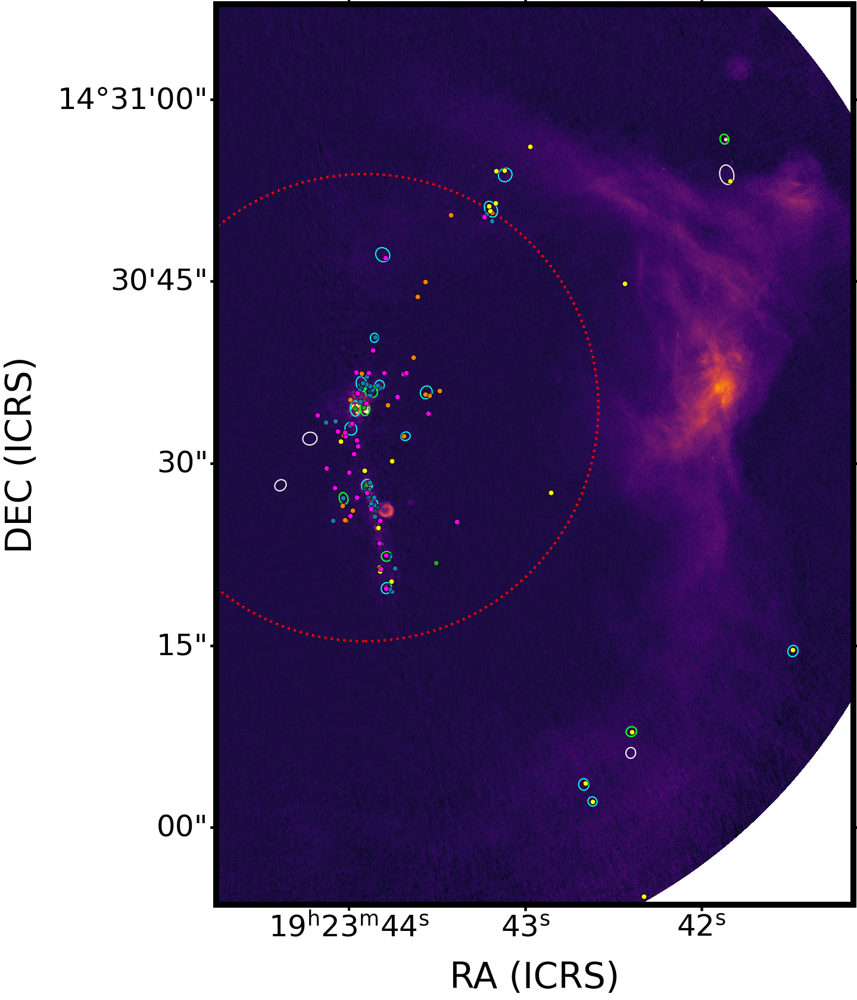

In [17]:
def plot_cores(ax, skypos, afwhm, bfwhm, theta, hdrhr, beam_almaimf,color='cyan', lw=2, label=None,fontsize=40,ls='solid'):
    wcsNB = WCS(hdrhr,naxis=2)
    scalehr = wcsNB.proj_plane_pixel_scales()[0]
    xypos = wcsNB.wcs_world2pix(skypos,0)

    for i in range(len(xypos)):
        meanbeamsize = (beam_almaimf.major.value+beam_almaimf.minor.value)/4
        major = (afwhm[i]/3600+meanbeamsize)/scalehr.value
        minor = (bfwhm[i]/3600+meanbeamsize)/scalehr.value
        pa = 90+theta[i]
        ellipse = Ellipse(xypos[i],width=major,height=minor,facecolor='none',
                          angle=180-pa,edgecolor=color,lw=lw) 
        ax.add_patch(ellipse)
        if label is not None:
            if isinstance(label[i],u.Quantity):
                ax.text(xypos[i][0],xypos[i][1],'%3.2f'%label[i].value,color=color,fontsize=8,ls=ls) 
            else:
                ax.text(xypos[i][0],xypos[i][1],label[i],color=color,fontsize=fontsize,ls=ls)
no_w51e_b6crit_b3fov = core_catdata_w51e_b6_b6crit_b3fov.no[multiplicity_w51e_b6crit_b3fov[1]]
no_w51n_b6crit_b3fov = core_catdata_w51n_b6_b6crit_b3fov.no[multiplicity_w51n_b6crit_b3fov[1]]

fig = plt.figure(figsize=(30,30))
ax1 = fig.add_axes([0.3,0.3,0.7,0.7],projection=wcs_highres_w51e_b3)
ax1.imshow(image_highres_w51e_b3, origin='lower',cmap=plt.get_cmap('inferno'),
           vmin=-0.00010907209521789237,vmax=0.0008191315689840496)
draw_field_of_view(ax1,image_highres_w51e_b6 , wcs_highres_w51e_b6, wcs_highres_w51e_b3 , color='r', lw=4, ls='dotted') 

#plot_cores(ax1, skypos_w51e_b6_b6crit_b3fov_prestellar, core_catdata_w51e_b6_b6crit_b3fov.afwhm[prestellar_w51e_b6crit_b3fov], core_catdata_w51e_b6_b6crit_b3fov.bfwhm[prestellar_w51e_b6crit_b3fov], core_catdata_w51e_b6_b6crit_b3fov.theta[prestellar_w51e_b6crit_b3fov], 
#           hdrhr_w51e_b3, beamb6_w51e_almaimf, color='cyan', lw=2, label=no_w51e_b6crit_b3fov[prestellar_w51e_b6crit_b3fov])
plot_cores(ax1, skypos_w51e_b6_b6crit_b3fov_prestellar, core_catdata_w51e_b6_b6crit_b3fov.afwhm[prestellar_w51e_b6crit_b3fov], core_catdata_w51e_b6_b6crit_b3fov.bfwhm[prestellar_w51e_b6crit_b3fov], core_catdata_w51e_b6_b6crit_b3fov.theta[prestellar_w51e_b6crit_b3fov], 
           hdrhr_w51e_b3, beamb6_w51e_almaimf, color='w', lw=2, ls='dashed')
skypos_w51e_b6_b6crit_b3fov_protostellar = np.vstack((core_catdata_w51e_b6_b6crit_b3fov.sky_ra[protostellar_w51e_b6crit_b3fov], core_catdata_w51e_b6_b6crit_b3fov.sky_dec[protostellar_w51e_b6crit_b3fov])).T
plot_cores(ax1, skypos_w51e_b6_b6crit_b3fov_protostellar, core_catdata_w51e_b6_b6crit_b3fov.afwhm[protostellar_w51e_b6crit_b3fov], core_catdata_w51e_b6_b6crit_b3fov.bfwhm[protostellar_w51e_b6crit_b3fov], core_catdata_w51e_b6_b6crit_b3fov.theta[protostellar_w51e_b6crit_b3fov], 
           hdrhr_w51e_b3, beamb6_w51e_almaimf, color='cyan', lw=2, ls='dashed' )

skypos_w51e_b6_b6crit_b3fov_wff= np.vstack((core_catdata_w51e_b6_b6crit_b3fov_ff.sky_ra, core_catdata_w51e_b6_b6crit_b3fov_ff.sky_dec)).T
plot_cores(ax1, skypos_w51e_b6_b6crit_b3fov_wff, core_catdata_w51e_b6_b6crit_b3fov_ff.afwhm, core_catdata_w51e_b6_b6crit_b3fov_ff.bfwhm, core_catdata_w51e_b6_b6crit_b3fov_ff.theta, 
           hdrhr_w51e_b3, beamb6_w51e_almaimf, color='lime', lw=2, ls='dashed' )


plot_dendrogram_new(ax1, catalog_w51e_yso, wcsNB=wcs_highres_w51e_b3,band='b3',size=80,color=si_w51e, facecolor=si_w51e)
ax1.set_ylim(1400,12000)
ax1.set_xlim(5500,13000)
ax1.set_xlabel('RA (ICRS)')
ax1.set_ylabel('DEC (ICRS)')
colors=sns.color_palette("tab10")


plt.savefig('ppo_map_si_w51e_largest.png')

37.79999999999136 AU
545.6740906009087 6050 5500 15


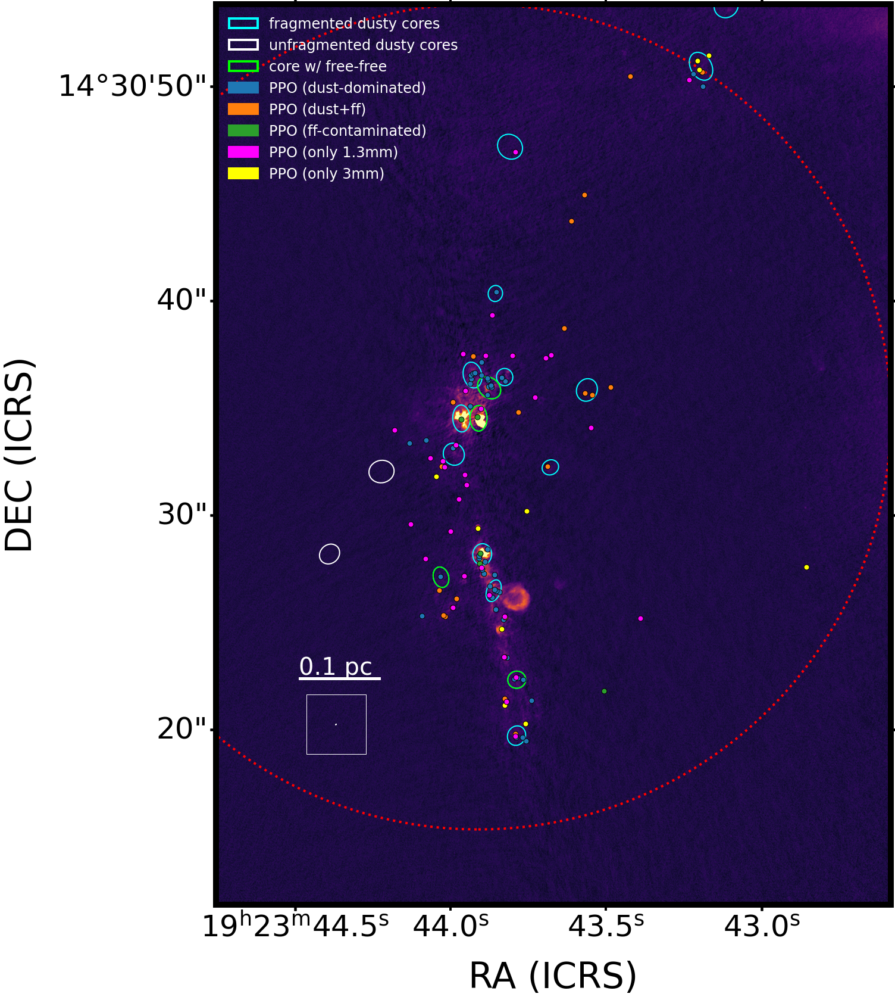

In [18]:

fig = plt.figure(figsize=(30,30))
ax1 = fig.add_axes([0.3,0.3,0.7,0.7],projection=wcs_highres_w51e_b3)
ax1.imshow(image_highres_w51e_b3, origin='lower',cmap=plt.get_cmap('inferno'),
           vmin=-0.00010907209521789237,vmax=0.0008191315689840496)
draw_field_of_view(ax1,image_highres_w51e_b6 , wcs_highres_w51e_b6, wcs_highres_w51e_b3 , color='r', lw=4, ls='dotted') 

plot_cores(ax1, skypos_w51e_b6_b6crit_b3fov_prestellar, core_catdata_w51e_b6_b6crit_b3fov.afwhm[prestellar_w51e_b6crit_b3fov], core_catdata_w51e_b6_b6crit_b3fov.bfwhm[prestellar_w51e_b6crit_b3fov], core_catdata_w51e_b6_b6crit_b3fov.theta[prestellar_w51e_b6crit_b3fov], 
           hdrhr_w51e_b3, beamb6_w51e_almaimf, color='w', lw=2, ls='dashed')
skypos_w51e_b6_b6crit_b3fov_protostellar = np.vstack((core_catdata_w51e_b6_b6crit_b3fov.sky_ra[protostellar_w51e_b6crit_b3fov], core_catdata_w51e_b6_b6crit_b3fov.sky_dec[protostellar_w51e_b6crit_b3fov])).T
plot_cores(ax1, skypos_w51e_b6_b6crit_b3fov_protostellar, core_catdata_w51e_b6_b6crit_b3fov.afwhm[protostellar_w51e_b6crit_b3fov], core_catdata_w51e_b6_b6crit_b3fov.bfwhm[protostellar_w51e_b6crit_b3fov], core_catdata_w51e_b6_b6crit_b3fov.theta[protostellar_w51e_b6crit_b3fov], 
           hdrhr_w51e_b3, beamb6_w51e_almaimf, color='cyan', lw=2, ls='dashed' )

skypos_w51e_b6_b6crit_b3fov_wff= np.vstack((core_catdata_w51e_b6_b6crit_b3fov_ff.sky_ra, core_catdata_w51e_b6_b6crit_b3fov_ff.sky_dec)).T
plot_cores(ax1, skypos_w51e_b6_b6crit_b3fov_wff, core_catdata_w51e_b6_b6crit_b3fov_ff.afwhm, core_catdata_w51e_b6_b6crit_b3fov_ff.bfwhm, core_catdata_w51e_b6_b6crit_b3fov_ff.theta, 
           hdrhr_w51e_b3, beamb6_w51e_almaimf, color='lime', lw=2, ls='dashed' )

plot_dendrogram_new(ax1, catalog_w51e_yso, wcsNB=wcs_highres_w51e_b3,band='b3',size=80,color=si_w51e, facecolor=si_w51e)
ax1.set_ylim(4000,10000)
ax1.set_xlim(5500,10000)
ax1.set_xlabel('RA (ICRS)')
ax1.set_ylabel('DEC (ICRS)')
colors=sns.color_palette("tab10")

circle = Circle((0,0),radius=0,  color='cyan', label='fragmented dusty cores',lw=4, fill=False)
ax1.add_patch(circle)
circle = Circle((0,0),radius=0, color='w', label='unfragmented dusty cores',lw=4, fill=False)
ax1.add_patch(circle)
circle = Circle((0,0),radius=0,  color='lime', label='core w/ free-free',lw=4, fill=False)
ax1.add_patch(circle)
circle = Circle((0,0),radius=0,  color=colors[0], label='PPO (dust-dominated)',lw=4,)
ax1.add_patch(circle)
circle = Circle((0,0),radius=0,  color=colors[1], label='PPO (dust+ff)',lw=4, )
ax1.add_patch(circle)
circle = Circle((0,0),radius=0,  color=colors[2], label='PPO (ff-contaminated)',lw=4, )
ax1.add_patch(circle)

circle = Circle((0,0),radius=0,  color='magenta', label='PPO (only 1.3mm)',lw=4, )
ax1.add_patch(circle)
circle = Circle((0,0),radius=0,  color='yellow', label='PPO (only 3mm)',lw=4, )
ax1.add_patch(circle)


ax1.legend(fontsize=24, loc='upper left',frameon=False, labelcolor='w')

add_beam(ax1,6300,5200, beam_highres_w51e_b3, scale_highres_w51e_b3,square=True,square_size=10000)
add_scale_bar(ax1, 6050, 5500, 0.1*u.pc, scale_highres_w51e_b3,5.4*u.kpc, xoffset=-0.4,height=15,pad=33)

plt.savefig('ppo_map_si_w51e_zoomed.png')

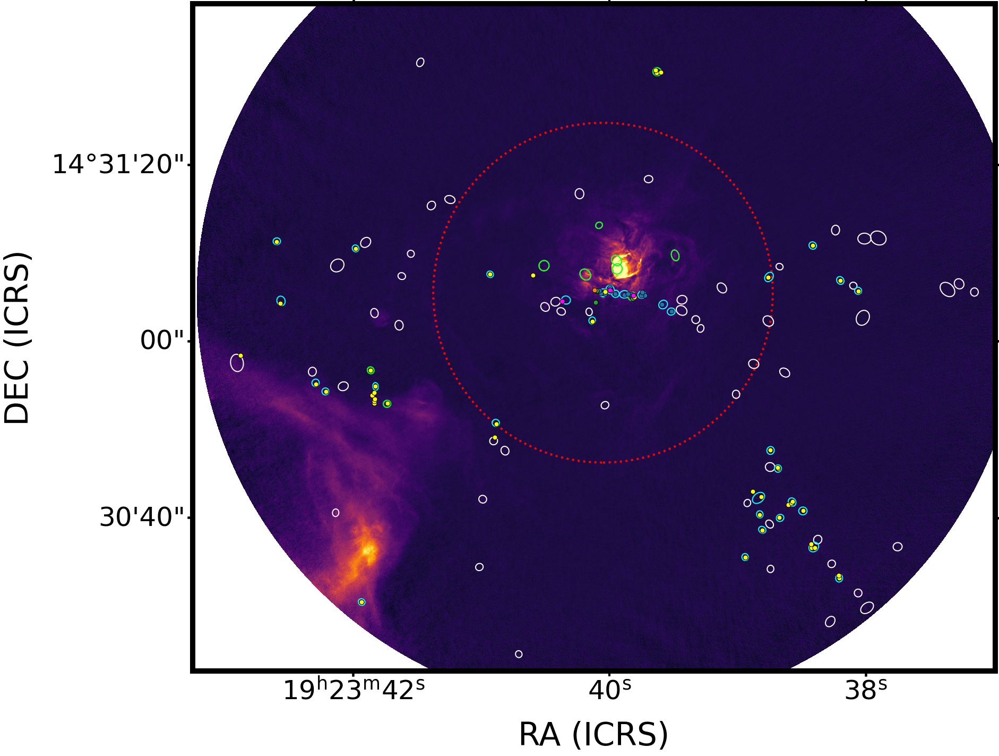

In [27]:
fitsdata_highres_w51n_b3 = fits.open(Path.w51n_b3_tt0)
image_highres_w51n_b3 = fitsdata_highres_w51n_b3[0].data[0][0]
hdr_highres_w51n_b3 = fits.getheader(Path.w51n_b3_tt0)
wcs_highres_w51n_b3 = WCS(hdr_highres_w51n_b3,naxis=2)
beam_highres_w51n_b3 = Beam.from_fits_header(hdr_highres_w51n_b3)
scale_highres_w51n_b3 = wcs_highres_w51n_b3.proj_plane_pixel_scales()[0]

fitsdata_highres_w51n_b6 = fits.open(Path.w51n_b6_cont)
image_highres_w51n_b6 = fitsdata_highres_w51n_b6[0].data[0][0]
hdr_highres_w51n_b6 = fits.getheader(Path.w51n_b6_cont)
wcs_highres_w51n_b6 = WCS(hdr_highres_w51n_b6,naxis=2)
beam_highres_w51n_b6 = Beam.from_fits_header(hdr_highres_w51n_b6)
scale_highres_w51n_b6 = wcs_highres_w51n_b6.proj_plane_pixel_scales()[0]

skypos_w51n_b6_b6crit_b3fov_prestellar = np.vstack((core_catdata_w51n_b6_b6crit_b3fov.sky_ra[prestellar_w51n_b6crit_b3fov], core_catdata_w51n_b6_b6crit_b3fov.sky_dec[prestellar_w51n_b6crit_b3fov])).T



fig = plt.figure(figsize=(30,30))
ax1 = fig.add_axes([0.3,0.3,0.7,0.7],projection=wcs_highres_w51n_b3)
ax1.imshow(image_highres_w51n_b3, origin='lower',cmap=plt.get_cmap('inferno'),
           vmin=-0.00010907209521789237,vmax=0.0008191315689840496)
draw_field_of_view(ax1,image_highres_w51n_b6 , wcs_highres_w51n_b6, wcs_highres_w51n_b3 , color='r', lw=4, ls='dotted') 

plot_cores(ax1, skypos_w51n_b6_b6crit_b3fov_prestellar, core_catdata_w51n_b6_b6crit_b3fov.afwhm[prestellar_w51n_b6crit_b3fov], core_catdata_w51n_b6_b6crit_b3fov.bfwhm[prestellar_w51n_b6crit_b3fov], core_catdata_w51n_b6_b6crit_b3fov.theta[prestellar_w51n_b6crit_b3fov], 
           hdrhr_w51n_b3, beamb6_w51n_almaimf, color='w', lw=2, ls='dashed')
skypos_w51n_b6_b6crit_b3fov_protostellar = np.vstack((core_catdata_w51n_b6_b6crit_b3fov.sky_ra[protostellar_w51n_b6crit_b3fov], core_catdata_w51n_b6_b6crit_b3fov.sky_dec[protostellar_w51n_b6crit_b3fov])).T
plot_cores(ax1, skypos_w51n_b6_b6crit_b3fov_protostellar, core_catdata_w51n_b6_b6crit_b3fov.afwhm[protostellar_w51n_b6crit_b3fov], core_catdata_w51n_b6_b6crit_b3fov.bfwhm[protostellar_w51n_b6crit_b3fov], core_catdata_w51n_b6_b6crit_b3fov.theta[protostellar_w51n_b6crit_b3fov], 
           hdrhr_w51n_b3, beamb6_w51n_almaimf, color='cyan', lw=2, ls='dashed' )

skypos_w51n_b6_b6crit_b3fov_wff= np.vstack((core_catdata_w51n_b6_b6crit_b3fov_ff.sky_ra, core_catdata_w51n_b6_b6crit_b3fov_ff.sky_dec)).T
plot_cores(ax1, skypos_w51n_b6_b6crit_b3fov_wff, core_catdata_w51n_b6_b6crit_b3fov_ff.afwhm, core_catdata_w51n_b6_b6crit_b3fov_ff.bfwhm, core_catdata_w51n_b6_b6crit_b3fov_ff.theta, 
           hdrhr_w51n_b3, beamb6_w51n_almaimf, color='lime', lw=2, ls='dashed' )

plot_dendrogram_new(ax1, catalog_w51n_yso, wcsNB=wcs_highres_w51n_b3,band='b3',size=80,color=si_w51n, facecolor=si_w51n)
#ax1.set_ylim(4000,10000)
#ax1.set_xlim(5500,10000)
ax1.set_xlabel('RA (ICRS)')
ax1.set_ylabel('DEC (ICRS)')
colors=sns.color_palette("tab10")

circle = Circle((0,0),radius=0,  color='cyan', label='fragmented dusty cores',lw=4, fill=False)
ax1.add_patch(circle)
circle = Circle((0,0),radius=0, color='w', label='unfragmented dusty cores',lw=4, fill=False)
ax1.add_patch(circle)
circle = Circle((0,0),radius=0,  color='lime', label='core w/ free-free',lw=4, fill=False)
ax1.add_patch(circle)
circle = Circle((0,0),radius=0,  color=colors[0], label='PPO (dust-dominated)',lw=4,)
ax1.add_patch(circle)
circle = Circle((0,0),radius=0,  color=colors[1], label='PPO (dust+ff)',lw=4, )
ax1.add_patch(circle)
circle = Circle((0,0),radius=0,  color=colors[2], label='PPO (ff-contaminated)',lw=4, )
ax1.add_patch(circle)

circle = Circle((0,0),radius=0,  color='magenta', label='PPO (only 1.3mm)',lw=4, )
ax1.add_patch(circle)
circle = Circle((0,0),radius=0,  color='yellow', label='PPO (only 3mm)',lw=4, )
ax1.add_patch(circle)


#ax1.legend(fontsize=24, loc='upper left',frameon=True, labelcolor='k')

#add_beam(ax1,6300,5200, beam_highres_w51n_b3, scale_highres_w51n_b3,square=True,square_size=10000)

#add_scale_bar(ax1, 6050, 5500, 0.1*u.pc, scale_highres_w51n_b3,5.4*u.kpc, xoffset=-0.4,height=15,pad=33)
ax1.set_ylim(1200,12000)
ax1.set_xlim(500,13500)
plt.savefig('ppo_map_si_w51n_largest1.png')


37.79999999999136 AU
545.6740906009087 7250 7000 25


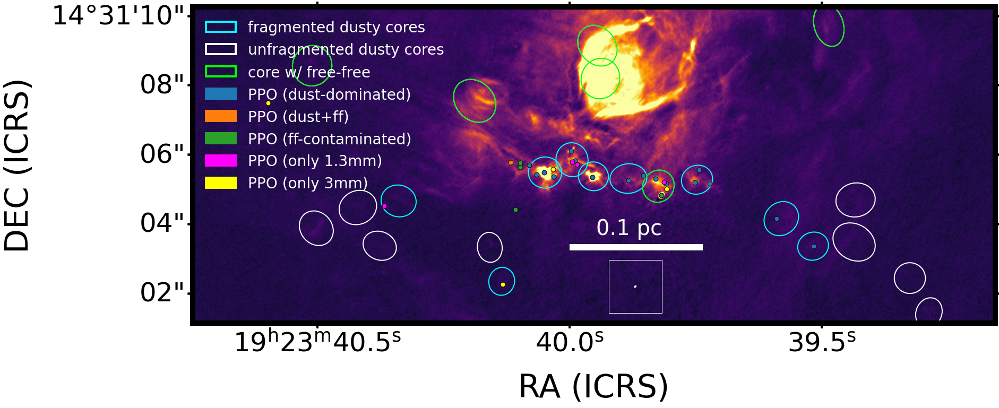

In [46]:
fitsdata_highres_w51n_b3 = fits.open(Path.w51n_b3_tt0)
image_highres_w51n_b3 = fitsdata_highres_w51n_b3[0].data[0][0]
hdr_highres_w51n_b3 = fits.getheader(Path.w51n_b3_tt0)
wcs_highres_w51n_b3 = WCS(hdr_highres_w51n_b3,naxis=2)
beam_highres_w51n_b3 = Beam.from_fits_header(hdr_highres_w51n_b3)
scale_highres_w51n_b3 = wcs_highres_w51n_b3.proj_plane_pixel_scales()[0]

fitsdata_highres_w51n_b6 = fits.open(Path.w51n_b6_cont)
image_highres_w51n_b6 = fitsdata_highres_w51n_b6[0].data[0][0]
hdr_highres_w51n_b6 = fits.getheader(Path.w51n_b6_cont)
wcs_highres_w51n_b6 = WCS(hdr_highres_w51n_b6,naxis=2)
beam_highres_w51n_b6 = Beam.from_fits_header(hdr_highres_w51n_b6)
scale_highres_w51n_b6 = wcs_highres_w51n_b6.proj_plane_pixel_scales()[0]

skypos_w51n_b6_b6crit_b3fov_prestellar = np.vstack((core_catdata_w51n_b6_b6crit_b3fov.sky_ra[prestellar_w51n_b6crit_b3fov], core_catdata_w51n_b6_b6crit_b3fov.sky_dec[prestellar_w51n_b6crit_b3fov])).T



fig = plt.figure(figsize=(30,30))
ax1 = fig.add_axes([0.3,0.3,0.7,0.7],projection=wcs_highres_w51n_b3)
ax1.imshow(image_highres_w51n_b3, origin='lower',cmap=plt.get_cmap('inferno'),
           vmin=-0.00010907209521789237,vmax=0.0008191315689840496)
draw_field_of_view(ax1,image_highres_w51n_b6 , wcs_highres_w51n_b6, wcs_highres_w51n_b3 , color='r', lw=4, ls='dotted') 

plot_cores(ax1, skypos_w51n_b6_b6crit_b3fov_prestellar, core_catdata_w51n_b6_b6crit_b3fov.afwhm[prestellar_w51n_b6crit_b3fov], core_catdata_w51n_b6_b6crit_b3fov.bfwhm[prestellar_w51n_b6crit_b3fov], core_catdata_w51n_b6_b6crit_b3fov.theta[prestellar_w51n_b6crit_b3fov], 
           hdrhr_w51n_b3, beamb6_w51n_almaimf, color='w', lw=2, ls='dashed')
skypos_w51n_b6_b6crit_b3fov_protostellar = np.vstack((core_catdata_w51n_b6_b6crit_b3fov.sky_ra[protostellar_w51n_b6crit_b3fov], core_catdata_w51n_b6_b6crit_b3fov.sky_dec[protostellar_w51n_b6crit_b3fov])).T
plot_cores(ax1, skypos_w51n_b6_b6crit_b3fov_protostellar, core_catdata_w51n_b6_b6crit_b3fov.afwhm[protostellar_w51n_b6crit_b3fov], core_catdata_w51n_b6_b6crit_b3fov.bfwhm[protostellar_w51n_b6crit_b3fov], core_catdata_w51n_b6_b6crit_b3fov.theta[protostellar_w51n_b6crit_b3fov], 
           hdrhr_w51n_b3, beamb6_w51n_almaimf, color='cyan', lw=2, ls='dashed' )

skypos_w51n_b6_b6crit_b3fov_wff= np.vstack((core_catdata_w51n_b6_b6crit_b3fov_ff.sky_ra, core_catdata_w51n_b6_b6crit_b3fov_ff.sky_dec)).T
plot_cores(ax1, skypos_w51n_b6_b6crit_b3fov_wff, core_catdata_w51n_b6_b6crit_b3fov_ff.afwhm, core_catdata_w51n_b6_b6crit_b3fov_ff.bfwhm, core_catdata_w51n_b6_b6crit_b3fov_ff.theta, 
           hdrhr_w51n_b3, beamb6_w51n_almaimf, color='lime', lw=2, ls='dashed' )

plot_dendrogram_new(ax1, catalog_w51n_yso, wcsNB=wcs_highres_w51n_b3,band='b3',size=80,color=si_w51n, facecolor=si_w51n)
#ax1.set_ylim(4000,10000)
#ax1.set_xlim(5500,10000)
ax1.set_xlabel('RA (ICRS)')
ax1.set_ylabel('DEC (ICRS)')
colors=sns.color_palette("tab10")

circle = Circle((0,0),radius=0,  color='cyan', label='fragmented dusty cores',lw=4, fill=False)
ax1.add_patch(circle)
circle = Circle((0,0),radius=0, color='w', label='unfragmented dusty cores',lw=4, fill=False)
ax1.add_patch(circle)
circle = Circle((0,0),radius=0,  color='lime', label='core w/ free-free',lw=4, fill=False)
ax1.add_patch(circle)
circle = Circle((0,0),radius=0,  color=colors[0], label='PPO (dust-dominated)',lw=4,)
ax1.add_patch(circle)
circle = Circle((0,0),radius=0,  color=colors[1], label='PPO (dust+ff)',lw=4, )
ax1.add_patch(circle)
circle = Circle((0,0),radius=0,  color=colors[2], label='PPO (ff-contaminated)',lw=4, )
ax1.add_patch(circle)

circle = Circle((0,0),radius=0,  color='magenta', label='PPO (only 1.3mm)',lw=4, )
ax1.add_patch(circle)
circle = Circle((0,0),radius=0,  color='yellow', label='PPO (only 3mm)',lw=4, )
ax1.add_patch(circle)


ax1.legend(fontsize=28, loc='upper left',frameon=False, labelcolor='w')

add_beam(ax1,7520,6850, beam_highres_w51n_b3, scale_highres_w51n_b3,square=True,square_size=10000)

add_scale_bar(ax1, 7250, 7000, 0.1*u.pc, scale_highres_w51n_b3,5.4*u.kpc, xoffset=-0.2,height=25,pad=63)
ax1.set_ylim(6700,8000)
ax1.set_xlim(5700,9000)
plt.savefig('ppo_map_si_w51n_zoomed.png')
